# 1. Cài đặt các thư viện cần thiết


In [4]:
!pip install torchsummary

In [7]:
import numpy as np #  Thư viện Python cho tính toán khoa học.
import pandas as pd # Thư viện dùng để xử lý và phân tích dữ liệu được biểu diễn dưới dạng bảng.

import os  # Thư viện cung cấp các phương thức để tương tác với hệ điều hành
import spacy  # Thư viện xử lý ngôn ngữ tự nhiên.
import torch # Thư viện PyTorch cho máy học và học sâu.
from torch.nn.utils.rnn import pad_sequence  # Hàm để chèn đệm cho batch.
from torch.utils.data import DataLoader, Dataset #  Các lớp cung cấp chức năng tải dữ liệu trong PyTorch.
from PIL import Image  # Module cung cấp các lớp và chức năng để mở, tải và lưu trữ ảnh.
import torchvision.transforms as transforms
import math
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
from textwrap import wrap
from tqdm import tqdm
import seaborn as sns

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.utils.rnn import pad_sequence
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchsummary import summary
from torchvision import utils
from torchvision.io import read_image
import torchvision.models as models
import torchvision.transforms as T

# 2. Exploratory Data Analysis (EDA) - Khám phá dữ liệu

In [8]:
# Đường dẫn đến tập dữ liệu
data_dir = '/kaggle/input/flickr8k'
image_folder = os.path.join(data_dir, 'Images')
captions_file = os.path.join(data_dir, 'captions.txt')

#### 2.1. Khám phá các tập tin dữ liệu

In [9]:
# Đọc và khám phá tập tin chú thích
captions_df = pd.read_csv(captions_file)
print("There are {} images".format(len(captions_df.image.unique())))
print("There are {} captions".format(len(captions_df)))
captions_df.head(10)

There are 8091 images
There are 40455 captions


,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...
5,1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting
6,1001773457_577c3a7d70.jpg,A black dog and a tri-colored dog playing with...
7,1001773457_577c3a7d70.jpg,A black dog and a white dog with brown spots a...
8,1001773457_577c3a7d70.jpg,Two dogs of different breeds looking at each o...
9,1001773457_577c3a7d70.jpg,Two dogs on pavement moving toward each other .


In [10]:
# Đọc và khám phá tập tin ảnh
def read_image(path, img_size=224):
    img = Image.open(path)
    img = img.resize((img_size,img_size))
    img = np.asarray(img)
    return img

#### 2.2. Hiển thị dữ liệu từ tập tin đã đọc

In [11]:
# Lấy mẫu và hiển thị {num_samples} mẫu từ tập dữ liệu có chú thích
def display_images(df, num_samples=16):
    """
    Hiển thị một lưới các hình ảnh từ tập dữ liệu có chú thích.

    Tham số:
        - df (DataFrame): DataFrame chứa thông tin về hình ảnh và chú thích.
        - num_samples (int): Số lượng mẫu hình ảnh cần hiển thị.
    """
    dim = int(math.sqrt(num_samples))
    samples_df = df.sample(num_samples)
    samples_df = samples_df.reset_index(drop=True)

    fig = plt.figure(figsize=(20.,20.))
    grid = ImageGrid(fig, 111,
                     nrows_ncols=(dim, dim),
                     axes_pad=1.)
    
    for ax, i in zip(grid, range(num_samples)):
        image = read_image(os.path.join(image_folder, samples_df.image[i]))
        ax.set_title("\n".join(wrap(samples_df.caption[i], 40)), fontdict=None, loc='center', color = "k")
        ax.grid(False)
        ax.imshow(image)

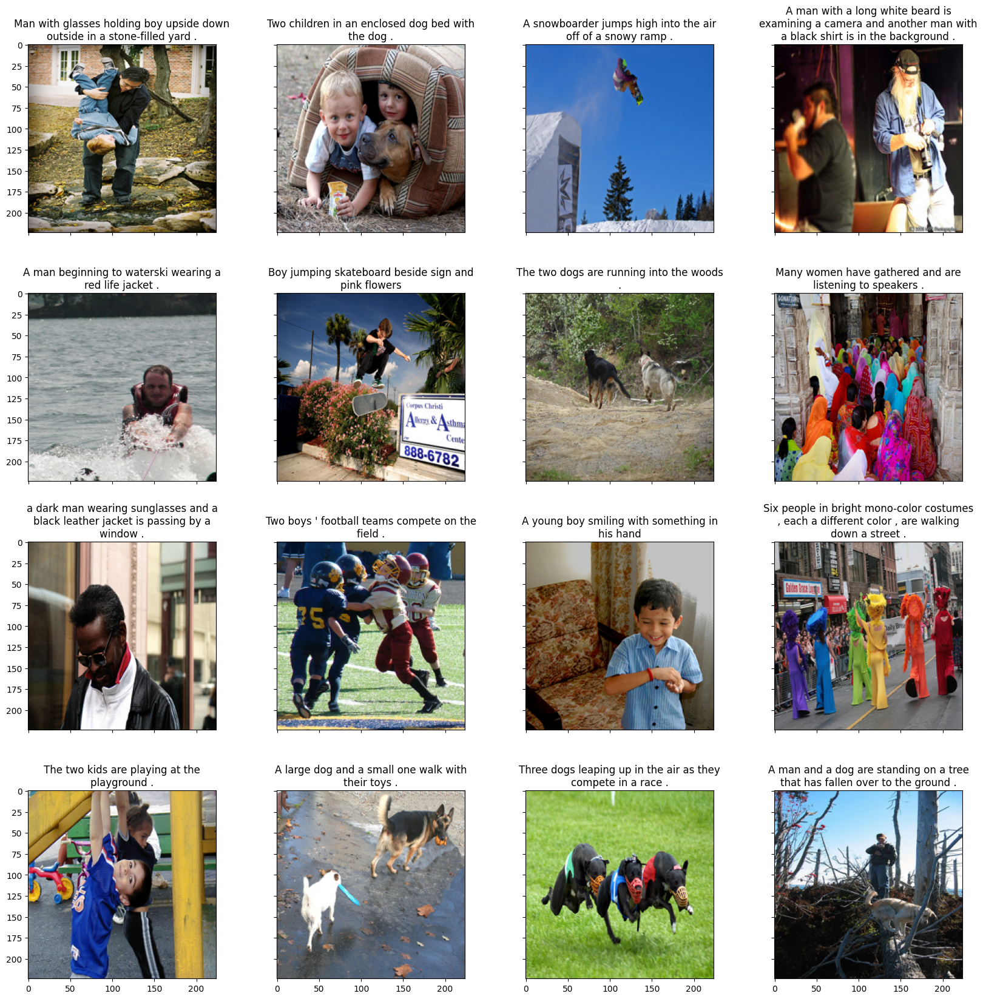

In [13]:
display_images(captions_df, 16)

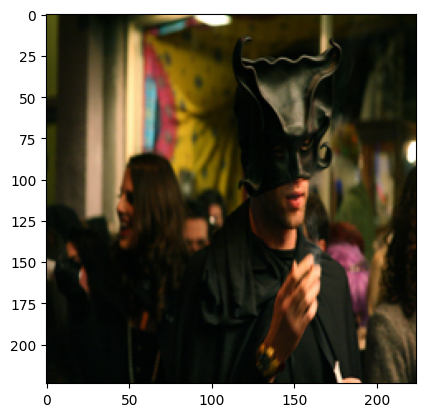

A man is wearing a black mask and black clothing in a social setting .
A person wearing a mask .
a single man wear a black mask with several people in the background
Man dressed in black wearing elaborate black mask
Man with mask on raises hand .


In [15]:
# Lấy một mẫu và in tất cả các chú thích liên quan đến mẫu đó
sample_image = captions_df.sample(1).reset_index(drop=True)['image'][0]
sample_captions = captions_df.loc[captions_df['image'] == sample_image]['caption']

image = read_image(os.path.join(image_folder, sample_image))
plt.imshow(image)
plt.grid(False)
plt.show()

for caption in sample_captions:
    print(caption)

# 3. Xử lý dữ liệu

In [17]:
# Sử dụng thư viện Spacy để phân đoạn từ trong các chú thích
spacy_eng = spacy.load("en_core_web_sm")

#### 3.1. Xây dựng lớp Vocabulary

In [18]:
# Vocabulary là một lớp từ điển để ánh xạ từng từ với một chỉ số (xây dựng từ điển)
class Vocabulary:
    def __init__(self, freq_threshold=1):
        """
        Hàm khởi tạo của lớp Vocabulary.

        Tham số:
            freq_threshold (int): Ngưỡng tần suất xuất hiện của từ để được thêm vào từ điển.
                                  Mặc định là 1.
        """
        # Khởi tạo từ điển với một số từ cơ bản như <PAD>, <SOS>, <EOS>, <UNK>.
        self.itos = {0:"<PAD>", 1:"<SOS>", 2:"<EOS>", 3:"<UNK>"}
        self.stoi = {"<PAD>": 0, "<SOS>": 1, "<EOS>": 2, "<UNK>": 3}
        self.freq_threshold = freq_threshold
    
    def __len__(self):
        """
        Trả về số lượng từ trong từ điển.

        Trả về:
            int: Số lượng từ trong từ điển.
        """
        return len(self.itos)
    
    @staticmethod
    def tokenize(caption):
        """
        Phương thức tách từ văn bản thành các token.

        Tham số:
            caption (str): Văn bản cần tách từ.

        Trả về:
            list: Danh sách các token sau khi tách từ.
        """
        return [token.text.lower() for token in spacy_eng.tokenizer(caption)]
    
    def build_vocabulary(self, caption_list):
        """
        Phương thức xây dựng từ điển từ danh sách các câu.

        Tham số:
            caption_list (list): Danh sách các câu cần xây dựng từ điển.

        Trả về:
            dict: Tần suất xuất hiện của các từ trong từ điển.
        """
        frequencies = {}
        idx = self.__len__()
        
        for caption in caption_list:
            for word in self.tokenize(caption):
                frequencies[word] = frequencies.get(word, 0) + 1
                
                if frequencies[word] == self.freq_threshold:
                    self.stoi[word] = idx
                    self.itos[idx] = word
                    idx += 1
        return frequencies
                    
    def numericalize(self, caption):
        """
        Phương thức số hóa văn bản.

        Tham số:
            caption (str): Văn bản cần số hóa.

        Trả về:
            list: Danh sách các chỉ số của các từ trong văn bản.
        """
        tokenized_caption = self.tokenize(caption)
        return [
            self.stoi[token] if token in self.stoi else self.stoi["<UNK>"] for token in tokenized_caption
        ]


#### 3.2. Xây dựng và biểu diễn thư viện từ lớp Vocabulary

In [19]:
# Xây dựng thư viện từ lớp Vocabulary
freq_threshold = 1 
captions = captions_df["caption"]
vocab = Vocabulary(freq_threshold)
frequencies = vocab.build_vocabulary(captions.tolist())

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


Text(0.5, 1.0, 'Top 50 most common words')

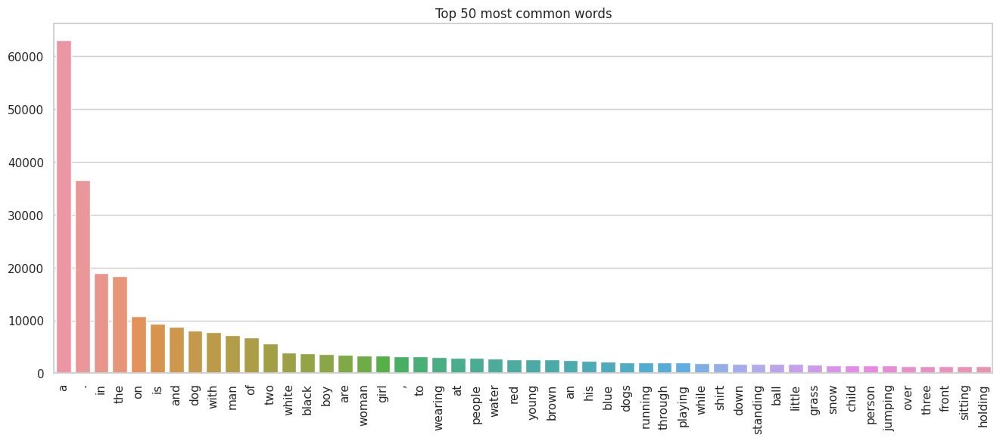

In [20]:
# Vẽ biểu đồ biểu diễn các từ xuất hiện nhiều nhất trong thư viện
frequencies = list(frequencies.items())
frequencies.sort(key=lambda x: x[1], reverse=True)
frequencies = frequencies[:50]
frequencies = {
    'x': [frequency[0] for frequency in frequencies],
    'y': [frequency[1] for frequency in frequencies]
}

sns.set(style='whitegrid')
plt.figure(figsize=(16,6))
sns.barplot(frequencies, x='x', y='y')
plt.xticks(rotation='vertical')
plt.title("Top 50 most common words")

#### 3.3. Xây dựng lớp FlickrDataset

In [21]:
# Tạo lớp Dataset từ ảnh và chú thích
# Tham khảo: https://www.kaggle.com/code/mdteach/torch-data-loader-flicker-8k
class FlickrDataset(Dataset):
    def __init__(self, root_dir, captions_file, transform=None, freq_threshold=5):
        """
        Hàm khởi tạo của lớp FlickrDataset.

        Tham số:
            root_dir (str): Đường dẫn đến thư mục chứa hình ảnh.
            captions_file (str): Đường dẫn đến tệp chứa các chú thích của hình ảnh.
            transform (callable, optional): Chuyển đổi hình ảnh (e.g., resize, normalize, augmentations).
                                            Mặc định là None.
            freq_threshold (int): Ngưỡng tần suất xuất hiện của từ để được thêm vào từ điển.
                                  Mặc định là 5.
        """
        self.root_dir = root_dir
        self.df = pd.read_csv(captions_file)
        self.transform = transform

        # Lấy cột ảnh và chú thích
        self.imgs = self.df["image"]
        self.captions = self.df["caption"]

        # Khởi tạo từ điển và xây dựng từ điển
        self.vocab = Vocabulary(freq_threshold)
        self.vocab.build_vocabulary(self.captions.tolist())

    def __len__(self):
        """
        Trả về số lượng mẫu trong tập dữ liệu.

        Trả về:
            int: Số lượng mẫu trong tập dữ liệu.
        """
        return len(self.df)

    def __getitem__(self, index):
        """
        Lấy một mẫu từ tập dữ liệu.

        Tham số:
            index (int): Chỉ mục của mẫu cần lấy.

        Trả về:
            tuple: Tuple chứa hình ảnh và chú thích đã được số hóa.
        """
        caption = self.captions[index]
        img_id = self.imgs[index]
        img = Image.open(os.path.join(self.root_dir, img_id)).convert("RGB")

        if self.transform is not None:
            img = self.transform(img)

        # Số hóa chú thích
        numericalized_caption = [self.vocab.stoi["<SOS>"]]
        numericalized_caption += self.vocab.numericalize(caption)
        numericalized_caption.append(self.vocab.stoi["<EOS>"])

        return img, torch.tensor(numericalized_caption)


#### 3.4. Xây dựng lớp MyCollate

In [22]:
# Lớp MyCollate để đệm batch.
class MyCollate:
    def __init__(self, pad_idx, batch_first):
        """
        Hàm khởi tạo của lớp MyCollate.

        Tham số:
            pad_idx (int): Chỉ số của token <PAD> trong từ điển.
            batch_first (bool): True nếu kích thước batch ở trước, False nếu kích thước batch ở sau.
        """
        self.pad_idx = pad_idx
        self.batch_first = batch_first

    def __call__(self, batch):
        """
        Phương thức __call__ của lớp MyCollate.

        Tham số:
            batch (list): Danh sách các mẫu từ tập dữ liệu.

        Trả về:
            tuple: Tuple chứa batch ảnh và batch chú thích đã được số hóa và đệm.
        """
        # Xử lý ảnh
        imgs = [item[0].unsqueeze(0) for item in batch]
        imgs = torch.cat(imgs, dim=0)

        # Xử lý chú thích
        targets = [item[1] for item in batch]
        targets = pad_sequence(targets, batch_first=self.batch_first, padding_value=self.pad_idx)

        return imgs, targets

#### 3.5. Xây dựng hàm DataLoader từ dữ liệu ảnh và chú thích
DataLoader này được sử dụng để tải dữ liệu theo batch trong quá trình huấn luyện mô hình

In [23]:
def get_loader(
    root_folder,
    annotation_file,
    transform,
    batch_size=32,
    num_workers=8,
    shuffle=True,
    pin_memory=True,
    batch_first=True
):
    """
    Hàm để tạo DataLoader.

    Tham số:
        root_folder (str): Đường dẫn đến thư mục chứa hình ảnh.
        annotation_file (str): Đường dẫn đến tệp chứa các chú thích của hình ảnh.
        transform (callable): Hàm biến đổi ảnh.
        batch_size (int, optional): Kích thước batch. Mặc định là 32.
        num_workers (int, optional): Số lượng worker sử dụng để tải dữ liệu. Mặc định là 8.
        shuffle (bool, optional): Xáo trộn dữ liệu trước khi chia thành các batch. Mặc định là True.
        pin_memory (bool, optional): Sử dụng pin_memory cho DataLoader hay không. Mặc định là True.
        batch_first (bool, optional): True nếu kích thước batch ở trước, False nếu kích thước batch ở sau. Mặc định là True.

    Trả về:
        tuple: DataLoader và đối tượng Dataset tương ứng.
    """
    # Tạo đối tượng Dataset từ FlickrDataset
    dataset = FlickrDataset(root_folder, annotation_file, transform=transform)

    # Lấy chỉ số của token <PAD> trong từ điển
    pad_idx = dataset.vocab.stoi["<PAD>"]

    # Tạo DataLoader
    loader = DataLoader(
        dataset=dataset,
        batch_size=batch_size,
        num_workers=num_workers,
        shuffle=shuffle,
        pin_memory=pin_memory,
        collate_fn=MyCollate(pad_idx, batch_first), # Sử dụng hàm MyCollate làm hàm collate_fn
    )

    return loader, dataset

In [24]:
# Thực hiện biến đổi để đưa hình ảnh về trạng thái ban đầu.
inv_normalize = T.Compose([
    T.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
    std=[1/0.229, 1/0.224, 1/0.225]
)
])

In [25]:
if __name__ == "__main__":
    # Thiết lập biến transform để chuyển đổi ảnh
    transform = transforms.Compose(
        [transforms.Resize((224, 224)), transforms.ToTensor(),]
    )
    
    # Tạo DataLoader
    loader, dataset = get_loader(
        "/kaggle/input/flickr8k/Images", "/kaggle/input/flickr8k/captions.txt", transform=transform
    )

/opt/conda/lib/python3.10/site-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


#### 3.6. Hiển thị các thông tin từ DataLoader

In [26]:
def display_dl_images(data_loader, dataset):
    """
    Hiển thị hình ảnh và chú thích từ DataLoader.

    Tham số:
        data_loader (DataLoader): Đối tượng DataLoader chứa dữ liệu.
        dataset: Đối tượng Dataset tương ứng với DataLoader.
    """
    fig = plt.figure(figsize=(20.,20.))
    grid = ImageGrid(fig, 111,
                     nrows_ncols=(4, 4),
                     axes_pad=1.)
    
    dataiter = iter(data_loader)
    batch = next(dataiter)
    images, captions = batch
    
    for ax, i in zip(grid, range(16)):
        img, cap = images[i], captions[i]
        img = inv_normalize(img)
        caption_label = [dataset.vocab.itos[token] for token in cap.tolist()]
        
        eos_index = caption_label.index('<EOS>')
        caption_label = caption_label[1:eos_index]
        caption_label = ' '.join(caption_label)                      
        img = img.numpy().transpose((1, 2, 0))
        
        ax.set_title("\n".join(wrap(caption_label, 40)), fontdict=None, loc='center', color = "k")
        ax.grid(False)
        ax.imshow(img)


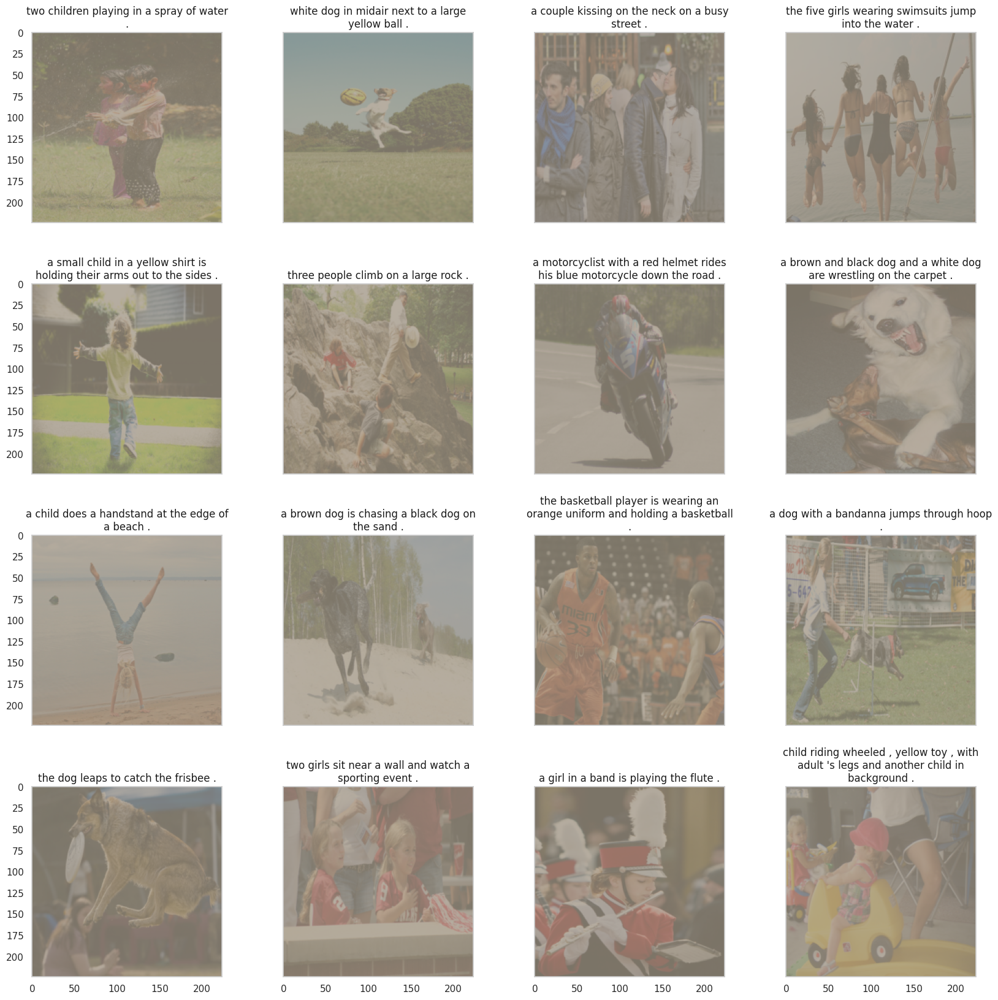

In [27]:
display_dl_images(loader, dataset)

# 4. Xây dựng mô hình (Model)
Phần này định nghĩa các mô hình cho bộ mã hóa (CNN_Encoder), bộ giải mã (RNN_Decoder) và kết hợp của chúng (Bridge) cho mô hình cơ bản và mô hình với cơ chế chú ý (Attention).

#### 4.1. Cài đặt thư viện

In [29]:
# Thêm thư viện cần thiết
import torch
import torch.nn as nn # Module trong PyTorch dùng để xây dựng mạng nơ-ron.
import torchvision.models as models # Chứa các kiến trúc mô hình mạng nơ-ron cho việc huấn luyện trên ảnh.

# Kiểm tra xem GPU có sẵn hay không, sau đó chọn thiết bị phù hợp để thực hiện tính toán
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#### 4.2. Mô hình không sử dụng Attention (mô hình cơ bản)

##### 4.2.1. Cài đặt bộ mã hóa CNN

In [30]:
# Lớp CNN_Encoder sẽ chuyển đổi hình ảnh thành một vectơ embedding dựa trên ResNet-50 để trích xuất đặc trưng từ hình ảnh
class CNN_Encoder(nn.Module):
    def __init__(self, embedding_len, trainConvNet=False):
        """
        Khởi tạo mạng CNN_Encoder.

        Tham số:
        - embedding_len (int): Kích thước của vectơ embedding đầu ra.
        - trainConvNet (bool): True nếu muốn fine-tuning mạng CNN, False nếu không.
        """
        super(CNN_Encoder, self).__init__()
        self.trainConvNet = False
        resnet = models.resnet50(pretrained=True)

        # Loại bỏ các lớp tuyến tính và lớp pool (vì chúng không cần thiết cho việc trích xuất đặc trưng)
        modules = list(resnet.children())[:-1]
        self.resnet = nn.Sequential(*modules)
        self.embed = nn.Linear(resnet.fc.in_features, embedding_len)

        # Đóng băng các tham số của mạng CNN
        for p in self.resnet.parameters():
            p.requires_grad = False
            
        # Nếu muốn fine-tuning, chỉ fine-tuning các block convolutional 2 đến 4
        for c in list(self.resnet.children())[5:]:
            for p in c.parameters():
                p.requires_grad = self.trainConvNet

    def forward(self, images):
        """
        Hàm forward của mạng CNN_Encoder.

        Tham số:
        - images (torch.Tensor): Batch hình ảnh đầu vào.

        Trả về:
        - out (torch.Tensor): Vectơ embedding của hình ảnh.
        """
        out = self.resnet(images)
        out = out.view(out.size(0), -1)
        out = self.embed(out)
        return out

##### 4.2.2. Cài đặt bộ giải mã RNN

In [31]:
# Lớp RNN để sinh chú thích dựa trên các đặc trưng của hình ảnh
class RNN_Decoder(nn.Module):
    def __init__(self, embedding_len, hidden_len, vocab_len, num_layers, dropout):
        """
        Khởi tạo mạng RNN.

        Tham số:
        - embedding_len (int): Kích thước của vectơ embedding.
        - hidden_len (int): Kích thước của hidden state.
        - vocab_len (int): Số lượng từ trong từ điển.
        - num_layers (int): Số lượng layer của mạng LSTM.
        - dropout (float): Giá trị dropout giữa các layer.
        """
        super(RNN_Decoder, self).__init__()
        self.embed = nn.Embedding(vocab_len, embedding_len)
        self.lstm = nn.LSTM(embedding_len, hidden_len, num_layers, batch_first=True)
        self.linear = nn.Linear(hidden_len, vocab_len) # hidden_len đến vocab_size, nó phục vụ như là chỉ mục
        self.dropout = nn.Dropout(dropout)

    def forward(self, features, captions):
        """
        Hàm forward của mạng RNN.

        Tham số:
        - features (torch.Tensor): Đặc trưng của hình ảnh.
        - captions (torch.Tensor): Chú thích của hình ảnh.

        Trả về:
        - outputs (torch.Tensor): Dự đoán các từ tiếp theo trong chú thích.
        """
        embeddings = self.embed(captions[:, :-1])
        # Thêm dropout sau layer embedding để giảm overfitting.
        embeddings = torch.cat((features.unsqueeze(1), embeddings), dim=1)
        # Ở đây, chúng ta đưa tất cả các chú thích chính xác vào mạng LSTM như là các embeddings.
        # Chúng ta đưa vào tất cả các ground truth chính xác vào mạng RNN và sau này trong quá trình đánh giá, 
        # chúng ta sẽ chỉ cần đưa đầu ra của cell trước đó vào, nhưng hiện tại điều này sẽ hoạt động tốt 
        # vì nó không học nhầm các chú thích không chính xác.
        # Ở đây, chúng ta muốn truyền vectơ đặc trưng từ CNN vào như là embedding đầu tiên cho RNN của chúng ta.
        # Vì vậy, chúng ta lấy đặc trưng đó và biến nó thành kích thước (1,embedding_len).
        # unsqueeze chỉ tạo kích thước từ (embedding_len,) thành (1,em) bằng cách thêm một chiều 1 ở vị trí 0.
        # Bây giờ chúng ta nối theo hướng hàng
        hiddens, _ = self.lstm(embeddings) # Đưa đặc trưng qua layer tuyến tính để có được đầu ra.
        outputs = self.linear(hiddens)
        return outputs

##### 4.2.3 Cài đặt cầu nối giữa CNN_RNN

In [32]:
# Lớp Bridge kết nối CNN_Encoder và RNN_Decoder
class Bridge(nn.Module):
    def __init__(self, embedding_len, hidden_len, vocab_len, num_layers, dropout):
        """
        Khởi tạo mạng Bridge.

        Tham số:
        - embedding_len (int): Kích thước của vectơ embedding đầu vào.
        - hidden_len (int): Kích thước của hidden state.
        - vocab_len (int): Số lượng từ trong từ điển.
        - num_layers (int): Số lượng layer của mạng LSTM.
        - dropout (float): Giá trị dropout giữa các layer.
        """
        super(Bridge, self).__init__()
        self.cnn_encoder = CNN_Encoder(embedding_len)
        self.rnn_decoder = RNN_Decoder(embedding_len, hidden_len, vocab_len, num_layers, dropout)

    def forward(self, images, captions):
        """
        Hàm forward của mạng Bridge.

        Tham số:
        - images (torch.Tensor): Batch hình ảnh đầu vào.
        - captions (torch.Tensor): Chú thích của hình ảnh.

        Trả về:
        - outputs (torch.Tensor): Dự đoán các từ tiếp theo trong chú thích.
        """
        features = self.cnn_encoder(images) # Lấy đặc trưng của hình ảnh và truyền vào mạng RNN.
        outputs = self.rnn_decoder(features, captions)
        return outputs

    # Hàm sinh chú thích cho hình ảnh
    def caption_image(self, image, vocabulary, max_len=50):
        """
        Tạo sinh chú thích cho hình ảnh đầu vào.

        Tham số:
        - image (torch.Tensor): Hình ảnh đầu vào.
        - vocabulary (torchtext.vocab.Vocab): Từ điển từ vựng.
        - max_len (int): Độ dài tối đa của chú thích.

        Trả về:
        - captions (list): Danh sách các từ trong chú thích được dự đoán.
        """
        captions = []
        with torch.no_grad():
            # Sử dụng torch.no_grad() để tắt tính toán gradient vì chúng ta không cần thiết trong quá trình sinh chú thích.
            # Chúng ta sử dụng unsqueeze để thêm chiều batch.
            x = self.cnn_encoder(image).unsqueeze(0)  # Bắt đầu với embedding đầu vào là x -> đặc trưng hình ảnh.
            states = None 
            for _ in range(max_len):
                # Lấy hidden layer và hidden state của đầu ra LSTM, hiddens sẽ chứa encoding.
                hiddens, states = self.rnn_decoder.lstm(x, states)
                # Truyền encoding qua lớp tuyến tính để có được dự đoán và từ tương ứng.
                output = self.rnn_decoder.linear(hiddens)
                output = output.view(x.size(0), -1)
                predicted = output.argmax(dim=1)
                # Dự đoán trước đó x được đưa vào bước thời gian tiếp theo của lstm.
                captions.append(predicted.item())
                x = self.rnn_decoder.embed(predicted).unsqueeze(0)

                if vocabulary.itos[predicted.item()] == "<EOS>":
                    break
        return [vocabulary.itos[idx] for idx in captions]

#### 4.3. Mô hình sử dụng Attention


##### 4.3.1. Cài đặt bộ mã hóa CNN_Attention

In [33]:
# Lớp CNN_Encoder_Att với cơ chế attention
class CNN_Encoder_Att(nn.Module):
    def __init__(self, trainConvNet=False):
        """
        Khởi tạo mạng CNN_Encoder_Att.

        Tham số:
        - trainConvNet (bool): True nếu muốn fine-tuning mạng CNN, False nếu không.
        """
        super(CNN_Encoder_Att, self).__init__()
        self.trainConvNet = False
        resnet = models.resnet50(pretrained=True)

        # Loại bỏ các lớp tuyến tính và lớp pool
        modules = list(resnet.children())[:-2]
        self.resnet = nn.Sequential(*modules)

        # Đóng băng các tham số của mạng CNN
        for p in self.resnet.parameters():
            p.requires_grad = False
        # Nếu muốn fine-tuning, chỉ fine-tuning các block convolutional 2 đến 4
        for c in list(self.resnet.children())[5:]:
            for p in c.parameters():
                p.requires_grad = self.trainConvNet

    def forward(self, images):
        """
        Hàm forward của mạng CNN_Encoder_Att.

        Tham số:
        - images (torch.Tensor): Batch hình ảnh đầu vào.

        Returns:
        - out (torch.Tensor): Đặc trưng của hình ảnh sau khi trải phẳng.
        """
        out = self.resnet(images)  # (batch_size, 2048, encoded_image_size, encoded_image_size)
        out = out.permute(0, 2, 3, 1)  # (batch_size, encoded_image_size, encoded_image_size, 2048)
        out = out.view(out.size(0), -1, out.size(-1))   # (batch_size, num_pixels, 2048)
        return out

##### 4.3.2. Cài đặt lớp Attention

In [34]:
# Lớp Attention
class Attention(nn.Module):
    def __init__(self, enc_dim, dec_dim, att_dim):
        """
        Khởi tạo mạng Attention.

        Tham số:
        - enc_dim (int): Kích thước của đặc trưng được mã hóa.
        - dec_dim (int): Kích thước của hidden state của decoder.
        - att_dim (int): Kích thước của vectơ attention.
        """
        super(Attention, self).__init__()
        self.enc_att = nn.Linear(enc_dim, att_dim)  # linear layer để biến đổi đặc trưng được mã hóa
        self.dec_att = nn.Linear(dec_dim, att_dim)  # linear layer để biến đổi đầu ra của decoder
        self.full_att = nn.Linear(att_dim, 1)  # linear layer để tính toán giá trị để thực hiện softmax
        self.relu = nn.ReLU()
        self.softmax = nn.Softmax(dim=1)  # softmax layer để tính toán trọng số

    def forward(self, features, dec_hid):
        """
        Hàm forward của mạng Attention.

        Tham số:
        - features (torch.Tensor): Đặc trưng của hình ảnh.
        - dec_hid (torch.Tensor): Hidden state của decoder.

        Trả về:
        - alpha (torch.Tensor): Trọng số attention.
        - att_weights (torch.Tensor): Đặc trưng của hình ảnh sau khi áp dụng attention.
        """
        encoder_att = self.enc_att(features)  # (batch_size, num_pixels, attention_dim)
        decoder_att = self.dec_att(dec_hid)  # (batch_size, attention_dim)
        att = self.full_att(self.relu(encoder_att + decoder_att.unsqueeze(1))).squeeze(2)  # (batch_size, num_pixels)
        alpha = self.softmax(att)  # (batch_size, num_pixels)
        att_weights = (features * alpha.unsqueeze(2)).sum(dim=1)  # (batch_size, enc_dim)

        return alpha, att_weights

##### 4.3.3. Cài đặt bộ giải mã RNN_Attention

In [35]:
# Lớp RNN_Att sử dụng cơ chế attention để sinh chú thích cho hình ảnh
class RNN_Decoder_Att(nn.Module):
    def __init__(self, att_dim, embedding_len, dec_dim, vocab_len, enc_dim=2048, dropout=0.5):
        """
        Khởi tạo mạng RNN_Att.

        Tham số:
        - att_dim (int): Kích thước của vectơ attention.
        - embedding_len (int): Kích thước của vectơ embedding.
        - dec_dim (int): Kích thước của hidden state của decoder.
        - vocab_len (int): Số lượng từ trong từ điển.
        - enc_dim (int): Kích thước của đặc trưng được mã hóa (mặc định là 2048 cho ResNet-50).
        - dropout (float): Giá trị dropout giữa các layer.
        """
        super(RNN_Decoder_Att, self).__init__()

        self.vocab_len = vocab_len

        self.attention = Attention(enc_dim, dec_dim, att_dim)       # Mạng attention
        self.embed = nn.Embedding(vocab_len, embedding_len)  # Lớp embedding
        self.dropout = nn.Dropout(dropout)
        self.lstm_cell = nn.LSTMCell(embedding_len + enc_dim, dec_dim, bias=True)  # LSTMCell của decoder
        self.init_h = nn.Linear(enc_dim, dec_dim)  # Lớp tuyến tính để tìm hidden state ban đầu của LSTMCell
        self.init_c = nn.Linear(enc_dim, dec_dim)  # Lớp tuyến tính để tìm cell state ban đầu của LSTMCell

        self.fc = nn.Linear(dec_dim, vocab_len)  # Lớp tuyến tính để tính điểm trên từ vựng

    def forward(self, features, captions):
        """
        Hàm forward của mạng RNN_Att.

        Tham số:
        - features (torch.Tensor): Đặc trưng của hình ảnh.
        - captions (torch.Tensor): Chú thích của hình ảnh.

        Returns:
        - preds (torch.Tensor): Dự đoán các từ tiếp theo trong chú thích.
        - alphas (torch.Tensor): Trọng số attention.
        """
        embeddings = self.embed(captions)
        h, c = self.init_hidden_state(features)

        cap_len = len(captions[0]) - 1
        batch_size = captions.size(0)
        num_features = features.size(1)

        preds = torch.zeros(batch_size, cap_len, self.vocab_len).to(device)
        alphas = torch.zeros(batch_size, cap_len, num_features).to(device)

        for cap in range(cap_len):
            alpha, context = self.attention(features, h)
            lstm_in = torch.cat([embeddings[:, cap], context], dim=1)
            h, c = self.lstm_cell(lstm_in, (h, c))
            out = self.fc(self.dropout(h))

            preds[:, cap] = out
            alphas[:, cap] = alpha

        return preds, alphas

    def init_hidden_state(self, features):
        """
        Hàm khởi tạo hidden state ban đầu của mạng.

        Tham số:
        - features (torch.Tensor): Đặc trưng của hình ảnh.

        Returns:
        - h (torch.Tensor): Hidden state ban đầu.
        - c (torch.Tensor): Cell state ban đầu.
        """
        mean_features = features.mean(dim=1)
        h = self.init_h(mean_features)  # (batch_size, decoder_dim)
        c = self.init_c(mean_features)
        return h, c


##### 4.4.4 Cài đặt cầu nối giữa CNN_RNN dùng Attention

In [36]:
# Lớp Bridge_Att kết nối CNN_Encoder_Att và RNN_Decoder_Att
class Bridge_Att(nn.Module):
    def __init__(self, embedding_len, vocab_len, att_dim, enc_dim, dec_dim):
        """
        Khởi tạo mạng Bridge_Att.

        Tham số:
        - embedding_len (int): Kích thước của vectơ embedding.
        - vocab_len (int): Số lượng từ trong từ điển.
        - att_dim (int): Kích thước của vectơ attention.
        - enc_dim (int): Kích thước của đặc trưng được mã hóa.
        - dec_dim (int): Kích thước của hidden state của decoder.
        """
        super(Bridge_Att, self).__init__()
        self.cnn_encoder = CNN_Encoder_Att()
        self.rnn_decoder = RNN_Decoder_Att(att_dim, embedding_len, dec_dim, vocab_len, enc_dim)

    def forward(self, images, captions):
        """
        Hàm forward của mạng Bridge_Att.

        Tham số:
        - images (torch.Tensor): Batch hình ảnh đầu vào.
        - captions (torch.Tensor): Batch chú thích của hình ảnh.

        Trả về:
        - outputs (tuple): Dự đoán các từ tiếp theo trong chú thích và trọng số attention tương ứng.
        """
        features = self.cnn_encoder(images) # Lấy đặc trưng của hình ảnh và truyền vào mạng RNN.
        outputs = self.rnn_decoder(features, captions)
        return outputs
    
    def caption_image(self, image, vocabulary, max_len=50):
        """
        Dự đoán chú thích của hình ảnh.

        Tham số:
        - image (torch.Tensor): Hình ảnh đầu vào.
        - vocabulary (torchtext.vocab.Vocab): Từ điển của dữ liệu.
        - max_len (int): Độ dài tối đa của chú thích.

        Trả về:
        - captions (list): Danh sách các từ trong chú thích dự đoán.
        - alphas (list): Trọng số attention tương ứng.
        """
        with torch.no_grad():
            features = self.cnn_encoder(image)

            batch_size = features.size(0)
            h, c = self.rnn_decoder.init_hidden_state(features)

            alphas = []
            captions = []

            # Từ đầu tiên
            word = torch.tensor(vocabulary.stoi['<SOS>']).view(1, -1).to(device)
            embeddings = self.rnn_decoder.embed(word)

            for _ in range(max_len):
                alpha, context = self.rnn_decoder.attention(features, h)
                alphas.append(alpha.cpu().detach().numpy())
                
                lstm_in = torch.cat([embeddings[:, 0], context], dim=1)
                h, c = self.rnn_decoder.lstm_cell(lstm_in, (h, c))
                out = self.rnn_decoder.fc(self.rnn_decoder.dropout(h))

                out = out.view(batch_size, -1)
                predicted = out.argmax(dim=1)

                captions.append(predicted.item())
                # Dự đoán trước đó embeddings được truyền vào bước thời gian tiếp theo của lstm.
                embeddings = self.rnn_decoder.embed(predicted.unsqueeze(0))

                if vocabulary.itos[predicted.item()] == "<EOS>":
                    break
            return [vocabulary.itos[idx] for idx in captions], alphas

# 5. Cài đặt các hàm huấn luyện mô hình

#### 5.1. Cài đặt các thư viện cần thiết

In [37]:
import torch
from tqdm import tqdm
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.tensorboard import SummaryWriter

2024-05-14 08:43:34.477244: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-14 08:43:34.477350: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-14 08:43:34.584788: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## 5.2. Hàm dừng huấn luyện sớm

In [40]:
class EarlyStopper:
    '''
    Dừng huấn luyện sớm nếu sự giảm thiểu của tổn thất trong quá trình kiểm tra không cải thiện thêm {min_delta} trong {patience} epochs
    '''
    def __init__(self, patience=1, min_delta=0.1):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.min_validation_loss = float('inf')

    def early_stop(self, validation_loss):
        if validation_loss < self.min_validation_loss:
            self.min_validation_loss = validation_loss
            self.counter = 0
        elif validation_loss > (self.min_validation_loss + self.min_delta):
            self.counter += 1
            if self.counter >= self.patience:
                return True
        return False

In [42]:
EARLY_STOPPING = True

#### 5.3. Hàm lưu checkpoint

##### 5.3.1. Hàm lưu checkpoint mô hình cơ bản

In [43]:
def save_checkpoint(state, filename="/kaggle/working/my_checkpoint.pth.tar"):
    """
    Lưu checkpoint của mô hình và trạng thái tối ưu hóa.

    Args:
        state (dict): Trạng thái của mô hình và tối ưu hóa để lưu.
        filename (str): Đường dẫn và tên tệp checkpoint. Mặc định là "/kaggle/working/my_checkpoint.pth.tar".
    """
    print("!!!!Saving checkpoint!!!!")
    torch.save(state, filename)

#### 5.3.2. Hàm lưu checkpoint mô hình có dùng attention

In [44]:
def save_checkpoint_att(state, filename="/kaggle/working/my_checkpoint_att.pth.tar"):
    print("!!!!Saving checkpoint!!!!")
    torch.save(state, filename)

#### 5.4. Hàm tải checkpoint

In [45]:
def load_checkpoint(checkpoint, model, optimizer):
    """
    Tải checkpoint đã lưu để tiếp tục huấn luyện hoặc kiểm tra mô hình.

    Args:
        checkpoint (dict): Dữ liệu checkpoint đã lưu.
        model: Mô hình cần cập nhật trạng thái.
        optimizer: Bộ tối ưu hóa cần cập nhật trạng thái.

    Returns:
        int: Bước tiếp theo trong quá trình huấn luyện.
    """
    print("!!!!Loading checkpoint!!!!")
    model.load_state_dict(checkpoint["state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer"])
    step = checkpoint["step"]
    return step

#### 5.5. Hàm thực hiện vòng lặp để huấn luyện mô hình

##### 5.5.1. Hàm huấn luyện mô hình cơ bản (không dùng Attention)

In [47]:
def train():
    """
    Huấn luyện mô hình mạng nơ-ron cho việc dự đoán chú thích hình ảnh.
    """
    # Định nghĩa các biến đổi ảnh
    transform = transforms.Compose(
        [
            transforms.Resize(226),                         # Thay đổi kích thước ảnh thành 226x226
            transforms.RandomCrop(224),                     # Cắt ngẫu nhiên ảnh thành 224x224
            transforms.ToTensor(),                          # Chuyển ảnh thành tensor
            transforms.Normalize((0.485, 0.456, 0.406),(0.229, 0.224, 0.225)), # Chuẩn hóa ảnh
        ]
    )

    # Tạo DataLoader và Dataset
    train_loader, dataset = get_loader(
        root_folder="/kaggle/input/flickr8k/Images",
        annotation_file="/kaggle/input/flickr8k/captions.txt",
        transform=transform,
        num_workers=2,
        batch_first=True
    )

    # Sử dụng GPU nếu có
    torch.backends.cudnn.benchmark = True
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(device)
    
    load_model = False     # Có load lại mô hình đã lưu trước đó không
    save_model = True      # Lưu mô hình sau mỗi epoch
    trainConvnet = False   # Chỉ fine-tune mạng CNN

    # Hyperparameters
    embedding_len = 400   # Kích thước embedding
    hidden_len = 512      # Kích thước hidden state
    vocab_len = len(dataset.vocab)  # Kích thước từ điển
    num_layers = 2         # Số lớp LSTM
    learning_rate = 4e-4   # Tốc độ học
    num_epochs = 10        # Số epoch

    # for tensorboard
    writer = SummaryWriter("runs/flickr")
    step = 0

    # Khởi tạo mô hình, loss function và optimizer
    model = Bridge(embedding_len, hidden_len, vocab_len, num_layers, 0.5).to(device)
    criterion = nn.CrossEntropyLoss(ignore_index=dataset.vocab.stoi["<PAD>"])
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    # Chỉ fine-tune mạng CNN
    for name, param in model.cnn_encoder.resnet.named_parameters():
        if "fc.weight" in name or "fc.bias" in name:
            param.requires_grad = True
        else:
            param.requires_grad = trainConvnet

    if load_model:
        step = load_checkpoint(torch.load("/kaggle/working/my_checkpoint.pth.tar"), model, optimizer)

    model.train()

    min_loss = float('inf')
    if EARLY_STOPPING:
        early_stopper = EarlyStopper(patience=10, min_delta=0.1)

    # Vòng lặp huấn luyện
    for epoch in range(num_epochs):
        # Uncomment the line below to see a couple of test cases
        # print_examples(model, device, dataset)
        losses = []

        for idx, (imgs, captions) in tqdm(
            enumerate(train_loader), total=len(train_loader), leave=False
        ):
            imgs = imgs.to(device)
            captions = captions.to(device)

            outputs = model(imgs, captions)
            loss = criterion(
                outputs.view(-1, outputs.shape[2]), captions.view(-1)
            )

            writer.add_scalar("Training loss", loss.item(), global_step=step)
            step += 1

            optimizer.zero_grad()
            loss.backward(loss)
            optimizer.step()
        checkpoint = {
                "state_dict": model.state_dict(),
                "optimizer": optimizer.state_dict(),
                "step": step,
            }
        save_checkpoint(checkpoint)

        loss = torch.tensor(losses).mean().item()

        if loss < min_loss:
            min_loss = loss
            checkpoint = {
                "state_dict": model.state_dict(),
                "optimizer": optimizer.state_dict(),
                "step": step,
            }
            save_checkpoint(checkpoint)
            
        # Điều kiện dừng    
        if EARLY_STOPPING and early_stopper.early_stop(loss):             
            break

##### 5.5.2. Hàm huấn luyện mô hình có dùng Attention

In [46]:
def train_att():
    transform = transforms.Compose(
        [
            transforms.Resize(226),
            transforms.RandomCrop(224),
            transforms.ToTensor(),
            transforms.Normalize((0.485, 0.456, 0.406),(0.229, 0.224, 0.225)),
        ]
    )

    # Tạo DataLoader và Dataset
    train_loader, dataset = get_loader(
        root_folder="/kaggle/input/flickr8k/Images",
        annotation_file="/kaggle/input/flickr8k/captions.txt",
        transform=transform,
        num_workers=2,
        batch_first=True
    )

    # Sử dụng GPU nếu có
    torch.backends.cudnn.benchmark = True
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(device)
    
    load_model = False     # Load mô hình đã lưu trước đó
    save_model = True     # Lưu mô hình sau mỗi epoch
    trainConvnet = False  # Chỉ fine-tune mạng CNN

    # Các siêu tham số
    embedding_len = 256   # Kích thước embedding
    vocab_len = len(dataset.vocab)  # Kích thước từ điển
    att_dim = 256         # Kích thước của attention
    enc_dim = 2048        # Kích thước của encoder
    dec_dim = 512         # Kích thước của decoder
    learning_rate = 3e-4  # Tốc độ học
    num_epochs = 10       # Số epoch

    # Tensorboard
    writer = SummaryWriter("runs/flickr")
    step = 0

    # Khởi tạo mô hình, loss function và optimizer
    model = Bridge_Att(embedding_len, vocab_len, att_dim, enc_dim, dec_dim).to(device)
    criterion = nn.CrossEntropyLoss(ignore_index=dataset.vocab.stoi["<PAD>"])
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    # Chỉ fine-tune mạng CNN
    for name, param in model.cnn_encoder.resnet.named_parameters():
        if "fc.weight" in name or "fc.bias" in name:
            param.requires_grad = True
        else:
            param.requires_grad = trainConvnet

    if load_model:
        step = load_checkpoint(torch.load("/kaggle/working/my_checkpoint_att.pth.tar"), model, optimizer)

    model.train()
    
    min_loss = float('inf')
    if EARLY_STOPPING:
        early_stopper = EarlyStopper(patience=10, min_delta=0.1)

    # Vòng lặp huấn luyện
    for epoch in range(num_epochs):
        # Uncomment the line below to see a couple of test cases
        # print_examples(model, device, dataset)
        losses = []
        
        for idx, (imgs, captions) in tqdm(
            enumerate(train_loader), total=len(train_loader), leave=False
        ):
            imgs = imgs.to(device)
            captions = captions.to(device)

            outputs, attentions = model(imgs, captions)
            loss = criterion(
                outputs.view(-1, vocab_len), captions[:,1:].reshape(-1)
            )

            writer.add_scalar("Training loss", loss.item(), global_step=step)
            step += 1

            optimizer.zero_grad()
            loss.backward(loss)
            optimizer.step()
            
        checkpoint = {
            "state_dict": model.state_dict(),
            "optimizer": optimizer.state_dict(),
            "step": step,
        }
        save_checkpoint_att(checkpoint)
        
        loss = torch.tensor(losses).mean().item()

        if loss < min_loss:
            min_loss = loss
            checkpoint = {
                "state_dict": model.state_dict(),
                "optimizer": optimizer.state_dict(),
                "step": step,
            }
            save_checkpoint_att(checkpoint)
            
        # Điều kiện dừng
        if EARLY_STOPPING and early_stopper.early_stop(loss):             
            break

# 6. Xây dựng các ví dụ để kiểm tra kết quả

#### 6.1. Thêm các câu tham chiếu cho các ví dụ kiểm tra

In [48]:
refsent1 = ["A girl and her horse stand by a fire .","A girl holding a horse 's lead behind a fire .","A man , and girl and two horses are near a contained fire .","Two people and two horses watching a fire ."]
refsent2 = ["A man fishes by a tree in the morning mist .","A man fishes under a large tree .","A man fishing near a large tree .","A man is fishing in a foggy lake ."]
refsent3 = ["a kayaker kayaks through the water .","A person kayaking in the ocean .","A person kayaks in the middle of the ocean on a grey day .","A person rows a boat over a large body of water .","person in a boat with a paddle in hand ."]
refsent4 = ["A man in a red jacket is sitting on a bench whilst cooking a meal .","A man sits on a bench .","A man is sitting on a bench , cooking some food .","A man wearing a red jacket is sitting on a wooden bench and is cooking something in a small pot .","a man wearing a red jacket sitting on a bench next to various camping items"]
refsent5 = ["A couple stands close at the water 's edge .","The two people stand by a body of water and in front of bushes in fall .","Two people hold each other near a pond .","Two people stand by the water .","Two people stand together on the edge of the water on the grass ."]

#### 6.2. Định nghĩa hàm để dự đoán với các ví dụ kiểm tra

In [49]:
printouts = []
def print_examples(model, device, dataset):
    """
    In ra các ví dụ về mô hình đưa ra dự đoán từ các hình ảnh đầu vào.

    Tham số:
        - model (object): Mô hình cần kiểm tra.
        - device (object): Thiết bị tính toán (cpu hoặc gpu).
        - dataset (object): Dữ liệu từ tập dữ liệu.

    Returns:
        None
    """
    printouts.clear()
    transform = transforms.Compose(
        [
            transforms.Resize(224),
            # transforms.RandomCrop(224),
            transforms.ToTensor(),
            transforms.Normalize((0.485, 0.456, 0.406),(0.229, 0.224, 0.225)),
        ]
    )

    model.eval()

    if(type(model)==Bridge_Att):
        test_img1 = transform(Image.open("/kaggle/input/flickr8k/Images/10815824_2997e03d76.jpg").convert("RGB")).unsqueeze(
            0
        )
        print("Example 1 CORRECT: A girl and her horse stand by a fire")
        out, _ = model.caption_image(test_img1.to(device), dataset.vocab)
        printouts.append(out)
        print(printouts)
        print(
            "Example 1 OUTPUT: "
            + " ".join(out)
        )
        test_img2 = transform(
            Image.open("/kaggle/input/flickr8k/Images/17273391_55cfc7d3d4.jpg").convert("RGB")
        ).unsqueeze(0)
        print("Example 2 CORRECT: A man fishes under a large tree")
        out, _ = model.caption_image(test_img2.to(device), dataset.vocab)
        printouts.append(out)
        print(printouts)
        print(
            "Example 2 OUTPUT: "
            + " ".join(out)
        )
        test_img3 = transform(Image.open("/kaggle/input/flickr8k/Images/19212715_20476497a3.jpg").convert("RGB")).unsqueeze(
            0
        )
        print("Example 3 CORRECT: A person kayaking in the ocean")
        out, _ = model.caption_image(test_img3.to(device), dataset.vocab)
        printouts.append(out)
        print(
            "Example 3 OUTPUT: "
            + " ".join(out)
        )
        test_img4 = transform(
            Image.open("/kaggle/input/flickr8k/Images/35506150_cbdb630f4f.jpg").convert("RGB")
        ).unsqueeze(0)
        print("Example 4 CORRECT: A man is sitting on a bench , cooking some food .")
        out, _ = model.caption_image(test_img4.to(device), dataset.vocab)
        printouts.append(out)
        print(
            "Example 4 OUTPUT: "
            + " ".join(out)
        )
        test_img5 = transform(
            Image.open("/kaggle/input/flickr8k/Images/3637013_c675de7705.jpg").convert("RGB")
        ).unsqueeze(0)
        print("Example 5 CORRECT: Two people stand together on the edge of the water on the grass")
        out, _ = model.caption_image(test_img5.to(device), dataset.vocab)
        printouts.append(out)
        print(
            "Example 5 OUTPUT: "
            + " ".join(out)
        )
    else:
        test_img1 = transform(Image.open("/kaggle/input/flickr8k/Images/10815824_2997e03d76.jpg").convert("RGB")).unsqueeze(
            0
        )
        print("Example 1 CORRECT: A girl and her horse stand by a fire")
        out = model.caption_image(test_img1.to(device), dataset.vocab)
        printouts.append(out)
        print(printouts)
        print(
            "Example 1 OUTPUT: "
            + " ".join(out)
        )
        test_img2 = transform(
            Image.open("/kaggle/input/flickr8k/Images/17273391_55cfc7d3d4.jpg").convert("RGB")
        ).unsqueeze(0)
        print("Example 2 CORRECT: A man fishes under a large tree")
        out = model.caption_image(test_img2.to(device), dataset.vocab)
        printouts.append(out)
        print(printouts)
        print(
            "Example 2 OUTPUT: "
            + " ".join(out)
        )
        test_img3 = transform(Image.open("/kaggle/input/flickr8k/Images/19212715_20476497a3.jpg").convert("RGB")).unsqueeze(
            0
        )
        print("Example 3 CORRECT: A person kayaking in the ocean")
        out = model.caption_image(test_img3.to(device), dataset.vocab)
        printouts.append(out)
        print(
            "Example 3 OUTPUT: "
            + " ".join(out)
        )
        test_img4 = transform(
            Image.open("/kaggle/input/flickr8k/Images/35506150_cbdb630f4f.jpg").convert("RGB")
        ).unsqueeze(0)
        print("Example 4 CORRECT: A man is sitting on a bench , cooking some food .")
        out = model.caption_image(test_img4.to(device), dataset.vocab)
        printouts.append(out)
        print(
            "Example 4 OUTPUT: "
            + " ".join(out)
        )
        test_img5 = transform(
            Image.open("/kaggle/input/flickr8k/Images/3637013_c675de7705.jpg").convert("RGB")
        ).unsqueeze(0)
        print("Example 5 CORRECT: Two people stand together on the edge of the water on the grass")
        out = model.caption_image(test_img5.to(device), dataset.vocab)
        printouts.append(out)
        print(
            "Example 5 OUTPUT: "
            + " ".join(out)
        )


# 7. Thực nghiệm huấn luyện và dự đoán kết quả

#### 7.1. Với mô hình không sử dụng Attention

##### 7.1.1. Huấn luyện

In [65]:
if __name__ == "__main__":
    train()

cuda


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


!!!!Saving checkpoint!!!!


!!!!Saving checkpoint!!!!


!!!!Saving checkpoint!!!!


!!!!Saving checkpoint!!!!


!!!!Saving checkpoint!!!!


!!!!Saving checkpoint!!!!


!!!!Saving checkpoint!!!!


!!!!Saving checkpoint!!!!


!!!!Saving checkpoint!!!!


!!!!Saving checkpoint!!!!


##### 7.1.2. Các trọng số của mô hình

In [66]:
embedding_len = 400
hidden_len = 512
vocab_len = len(dataset.vocab)
num_layers = 2
learning_rate = 3e-4
model = Bridge(embedding_len, hidden_len, vocab_len, num_layers, 0.5).to(device)
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
load_checkpoint(torch.load("/kaggle/working/my_checkpoint.pth.tar"), model, optimizer)

!!!!Loading checkpoint!!!!


12650

##### 7.1.3. Dự đoán kết quả từ các hình ảnh ví dụ

In [67]:
print_examples(model, device, dataset)

Example 1 CORRECT: A girl and her horse stand by a fire
[['<SOS>', 'a', 'man', 'in', 'a', 'cowboy', 'hat', 'is', 'playing', 'cricket', 'on', 'a', 'grassy', 'field', '.', '<EOS>']]
Example 1 OUTPUT: <SOS> a man in a cowboy hat is playing cricket on a grassy field . <EOS>
Example 2 CORRECT: A man fishes under a large tree
[['<SOS>', 'a', 'man', 'in', 'a', 'cowboy', 'hat', 'is', 'playing', 'cricket', 'on', 'a', 'grassy', 'field', '.', '<EOS>'], ['<SOS>', 'a', 'man', 'is', 'walking', 'on', 'a', 'sidewalk', 'in', 'front', 'of', 'a', 'large', 'building', '.', '<EOS>']]
Example 2 OUTPUT: <SOS> a man is walking on a sidewalk in front of a large building . <EOS>
Example 3 CORRECT: A person kayaking in the ocean
Example 3 OUTPUT: <SOS> a man is standing on a beach looking at the water . <EOS>
Example 4 CORRECT: A man is sitting on a bench , cooking some food .
Example 4 OUTPUT: <SOS> a boy in a red shirt is climbing a rock wall . <EOS>
Example 5 CORRECT: Two people stand together on the edge of 

#### 7.2. Với mô hình có sử dụng Attention

##### 7.2.1. Huấn luyện

In [53]:
if __name__ == "__main__":
    train_att()

cuda


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


!!!!Saving checkpoint!!!!


!!!!Saving checkpoint!!!!


!!!!Saving checkpoint!!!!


!!!!Saving checkpoint!!!!


!!!!Saving checkpoint!!!!


!!!!Saving checkpoint!!!!


!!!!Saving checkpoint!!!!


!!!!Saving checkpoint!!!!


!!!!Saving checkpoint!!!!


!!!!Saving checkpoint!!!!


##### 7.2.2. Các trọng số của mô hình

In [54]:
embedding_len = 256
vocab_len = len(dataset.vocab)
att_dim=256
enc_dim=2048
dec_dim=512
learning_rate = 3e-4
model_att = Bridge_Att(embedding_len, vocab_len, att_dim, enc_dim, dec_dim).to(device)
optimizer_att = optim.Adam(model_att.parameters(), lr=learning_rate)
load_checkpoint(torch.load("/kaggle/working/my_checkpoint_att.pth.tar"), model_att, optimizer_att)

!!!!Loading checkpoint!!!!


12650

##### 7.2.3. Dự đoán kết quả từ các hình ảnh ví dụ

In [55]:
print_examples(model_att, device, dataset)

Example 1 CORRECT: A girl and her horse stand by a fire
[['a', 'man', 'and', 'a', 'dog', 'are', 'running', 'through', 'a', 'field', '.', '<EOS>']]
Example 1 OUTPUT: a man and a dog are running through a field . <EOS>
Example 2 CORRECT: A man fishes under a large tree
[['a', 'man', 'and', 'a', 'dog', 'are', 'running', 'through', 'a', 'field', '.', '<EOS>'], ['a', 'man', 'is', 'standing', 'in', 'a', 'puddle', 'of', 'a', 'lake', '.', '<EOS>']]
Example 2 OUTPUT: a man is standing in a puddle of a lake . <EOS>
Example 3 CORRECT: A person kayaking in the ocean
Example 3 OUTPUT: a person is surfing on a boat . <EOS>
Example 4 CORRECT: A man is sitting on a bench , cooking some food .
Example 4 OUTPUT: a man in a red jacket is riding a bike on a wooden bench . <EOS>
Example 5 CORRECT: Two people stand together on the edge of the water on the grass
Example 5 OUTPUT: a man is riding a canoe on a lake . <EOS>


# 8. Đánh giá (dựa trên độ đo BLEU-4 and METEOR)

In [56]:
pip install --upgrade nltk

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 35.2 MB/s eta 0:00:0000:01
  Attempting uninstall: nltk
    Found existing installation: nltk 3.2.4
    Uninstalling nltk-3.2.4:
      Successfully uninstalled nltk-3.2.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
preprocessing 0.1.13 requires nltk==3.2.4, but you have nltk 3.8.1 which is incompatible.
Note: you may need to restart the kernel to use updated packages.


In [61]:
import nltk
nltk.download('omw-1.4')
nltk.download('punkt')
nltk.download('corpora')
nltk.download('corpus')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
from nltk.tokenize import word_tokenize
from nltk.corpus import wordnet
from nltk.stem import WordNetLemmatizer

from nltk.translate import meteor_score

[nltk_data] Downloading package omw-1.4 to /usr/share/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Error loading corpora: Package 'corpora' not found in
[nltk_data]     index
[nltk_data] Error loading corpus: Package 'corpus' not found in index
[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /usr/share/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


**Without Attention**

In [68]:
print_examples(model, device, dataset)

Example 1 CORRECT: A girl and her horse stand by a fire
[['<SOS>', 'a', 'man', 'in', 'a', 'cowboy', 'hat', 'is', 'playing', 'cricket', 'on', 'a', 'grassy', 'field', '.', '<EOS>']]
Example 1 OUTPUT: <SOS> a man in a cowboy hat is playing cricket on a grassy field . <EOS>
Example 2 CORRECT: A man fishes under a large tree
[['<SOS>', 'a', 'man', 'in', 'a', 'cowboy', 'hat', 'is', 'playing', 'cricket', 'on', 'a', 'grassy', 'field', '.', '<EOS>'], ['<SOS>', 'a', 'man', 'is', 'walking', 'on', 'a', 'sidewalk', 'in', 'front', 'of', 'a', 'large', 'building', '.', '<EOS>']]
Example 2 OUTPUT: <SOS> a man is walking on a sidewalk in front of a large building . <EOS>
Example 3 CORRECT: A person kayaking in the ocean
Example 3 OUTPUT: <SOS> a man is standing on a beach looking at the water . <EOS>
Example 4 CORRECT: A man is sitting on a bench , cooking some food .
Example 4 OUTPUT: <SOS> a boy in a red shirt is climbing a rock wall . <EOS>
Example 5 CORRECT: Two people stand together on the edge of 

In [69]:
candidate_sentencelist = printouts
reference_sentenceslist = [refsent1, refsent2, refsent3, refsent4, refsent5]

for i in range(5):
    print("Ví dụ: ", i + 1)
    candidate_sentence = candidate_sentencelist[i]
    reference_sentences = reference_sentenceslist[i]

    # Kiểm tra và chuyển candidate_sentence thành chuỗi nếu cần thiết
    if isinstance(candidate_sentence, list):
        candidate_sentence = " ".join(candidate_sentence)
    
    # Tokenize câu ứng viên
    candidate_tokens = nltk.word_tokenize(candidate_sentence.lower())

    # Tokenize các câu tham chiếu
    reference_tokens = [nltk.word_tokenize(sentence.lower()) for sentence in reference_sentences]

    # Tính điểm BLEU-4
    smoothie = SmoothingFunction().method4
    bleu_score = sentence_bleu(reference_tokens, candidate_tokens, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smoothie)
    print("Điểm BLEU-4:", bleu_score)

    # Tính điểm METEOR
    meteor = meteor_score.meteor_score(reference_tokens, candidate_tokens)
    print("Điểm METEOR:", meteor, "\n\n")

Ví dụ:  1
Điểm BLEU-4: 0.03727007317885059
Điểm METEOR: 0.16806722689075632 


Ví dụ:  2
Điểm BLEU-4: 0.0857638596526182
Điểm METEOR: 0.4221672167216721 


Ví dụ:  3
Điểm BLEU-4: 0.09174309464105414
Điểm METEOR: 0.46296296296296297 


Ví dụ:  4
Điểm BLEU-4: 0.08615634529232835
Điểm METEOR: 0.21604938271604937 


Ví dụ:  5
Điểm BLEU-4: 0.02112296650357935
Điểm METEOR: 0.18749999999999997 




**With attention**

In [58]:
print_examples(model_att, device, dataset)

Example 1 CORRECT: A girl and her horse stand by a fire
[['a', 'man', 'and', 'a', 'dog', 'are', 'running', 'through', 'a', 'field', '.', '<EOS>']]
Example 1 OUTPUT: a man and a dog are running through a field . <EOS>
Example 2 CORRECT: A man fishes under a large tree
[['a', 'man', 'and', 'a', 'dog', 'are', 'running', 'through', 'a', 'field', '.', '<EOS>'], ['a', 'man', 'is', 'standing', 'in', 'a', 'puddle', 'of', 'a', 'lake', '.', '<EOS>']]
Example 2 OUTPUT: a man is standing in a puddle of a lake . <EOS>
Example 3 CORRECT: A person kayaking in the ocean
Example 3 OUTPUT: a person is surfing on a boat . <EOS>
Example 4 CORRECT: A man is sitting on a bench , cooking some food .
Example 4 OUTPUT: a man in a red jacket is riding a bike on a wooden bench . <EOS>
Example 5 CORRECT: Two people stand together on the edge of the water on the grass
Example 5 OUTPUT: a man is riding a canoe on a lake . <EOS>


In [62]:
candidate_sentencelist = printouts
reference_sentenceslist = [refsent1, refsent2, refsent3, refsent4, refsent5]

for i in range(5):
    print("Ví dụ: ", i + 1)
    candidate_sentence = candidate_sentencelist[i]
    reference_sentences = reference_sentenceslist[i]

    # Kiểm tra và chuyển candidate_sentence thành chuỗi nếu cần thiết
    if isinstance(candidate_sentence, list):
        candidate_sentence = " ".join(candidate_sentence)
    
    # Tokenize câu ứng viên
    candidate_tokens = nltk.word_tokenize(candidate_sentence.lower())

    # Tokenize các câu tham chiếu
    reference_tokens = [nltk.word_tokenize(sentence.lower()) for sentence in reference_sentences]

    # Tính điểm BLEU-4
    smoothie = SmoothingFunction().method4
    bleu_score = sentence_bleu(reference_tokens, candidate_tokens, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smoothie)
    print("Điểm BLEU-4:", bleu_score)

    # Tính điểm METEOR
    meteor = meteor_score.meteor_score(reference_tokens, candidate_tokens)
    print("Điểm METEOR:", meteor, "\n\n")

Ví dụ:  1
Điểm BLEU-4: 0.05643910181236486
Điểm METEOR: 0.22123893805309733 


Ví dụ:  2
Điểm BLEU-4: 0.13243122130715332
Điểm METEOR: 0.6025778732545649 


Ví dụ:  3
Điểm BLEU-4: 0.08990719279128671
Điểm METEOR: 0.3255474452554745 


Ví dụ:  4
Điểm BLEU-4: 0.4989070972910272
Điểm METEOR: 0.7630214040470452 


Ví dụ:  5
Điểm BLEU-4: 0.022818144408437196
Điểm METEOR: 0.10638297872340426 




# 9. Trực quan hóa Sự chú ý (Attention)


#### 9.1. Các hàm để lấy các đồ thị hình ảnh có attention

##### 9.1.1. Thêm các thư viện cần thiết

In [70]:
import matplotlib.pyplot as plt
import copy

##### 9.1.2. Hàm hiển thị ảnh

In [71]:
def show_image(img, title=None):
    """
    Hiển thị hình ảnh.

    Tham số:
        img (torch.Tensor): Hình ảnh cần hiển thị.
        title (str, optional): Tiêu đề hình ảnh. Mặc định là None.
    """
    img = img.numpy().transpose((1, 2, 0))
    
    plt.imshow(img)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # tạm dừng một chút để cập nhật các biểu đồ

##### 9.1.3. Hàm tạo chú thích không dùng Attention

In [72]:
def get_captions(image):
    """
    Tạo chú thích cho hình ảnh sử dụng mô hình cơ bản.

    Tham số:
        image (torch.Tensor): Hình ảnh đầu vào.

    Trả về:
        list: Chú thích của hình ảnh.
    """
    # tạo chú thích
    model.eval()
    with torch.no_grad():
        caps = model.caption_image(image.to(device), dataset.vocab)
        caption = ' '.join(caps)
        show_image(image[0],title=caption)
    return caps

##### 9.1.4. Hàm tạo chú thích có Attention

In [73]:
def get_captions_att(image):
    """
    Tạo chú thích và sự chú ý cho hình ảnh sử dụng mô hình Attention.

    Tham số:
        image (torch.Tensor): Hình ảnh đầu vào.

    Trả về:
        tuple: Bao gồm chú thích và sự chú ý.
    """
    # tạo chú thích
    model_att.eval()
    with torch.no_grad():
        caps, alphas = model_att.caption_image(image.to(device), dataset.vocab)
        caption = ' '.join(caps)
        show_image(image[0],title=caption)
    return caps, alphas

##### 9.1.5. Hàm trực quan hóa Attention

In [74]:
def plot_attention(img, result, attention_plot):
    """
    Trực quan hóa sự chú ý của mô hình.

    Tham số:
        img (torch.Tensor): Hình ảnh gốc.
        result (list): Danh sách các chú thích.
        attention_plot (torch.Tensor): Sự chú ý của mô hình.

    """
    img = img.numpy().transpose((1, 2, 0))
    temp_image = img

    fig = plt.figure(figsize=(15, 15))

    len_result = len(result)
    for l in range(len_result):
        temp_att = attention_plot[l].reshape(7,7)
        
        ax = fig.add_subplot(len_result//2,len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.7, extent=img.get_extent())
        

    plt.tight_layout()
    plt.show()

#### 9.2. Trực quan hóa hình ảnh với Attention

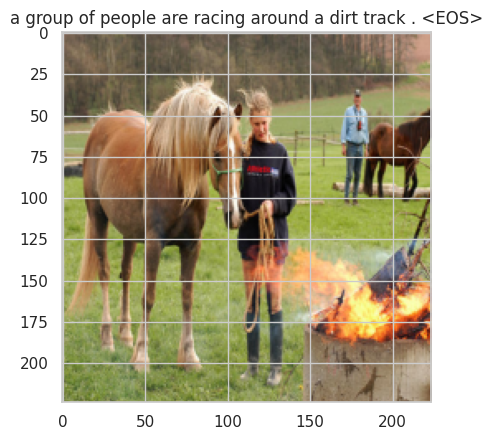

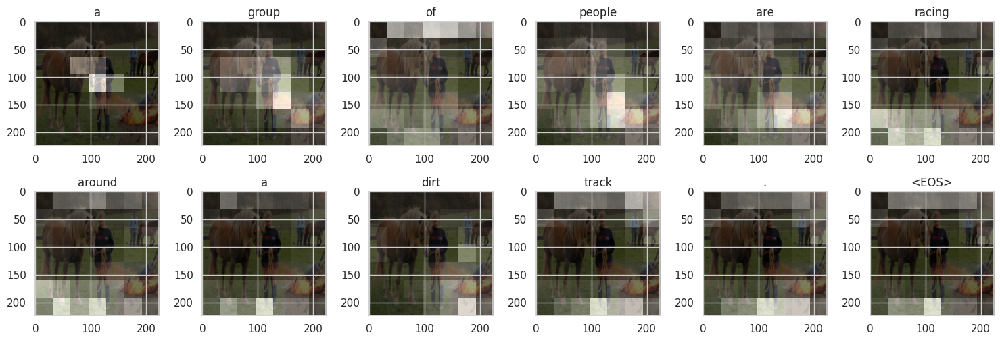

In [76]:
test_img1 = transform(Image.open("/kaggle/input/flickr8k/Images/10815824_2997e03d76.jpg").convert("RGB"))
img1 = copy.deepcopy(test_img1)
capsatt, alphas = get_captions_att(test_img1.unsqueeze(0))

plot_attention(img1, capsatt, alphas)

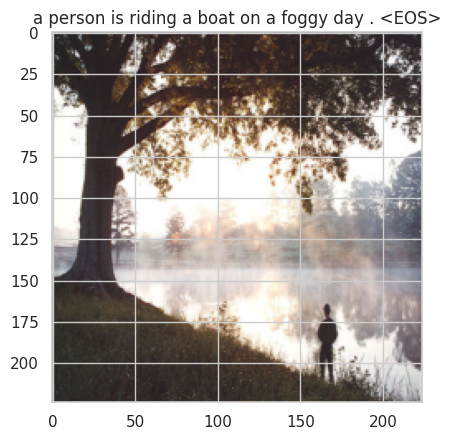

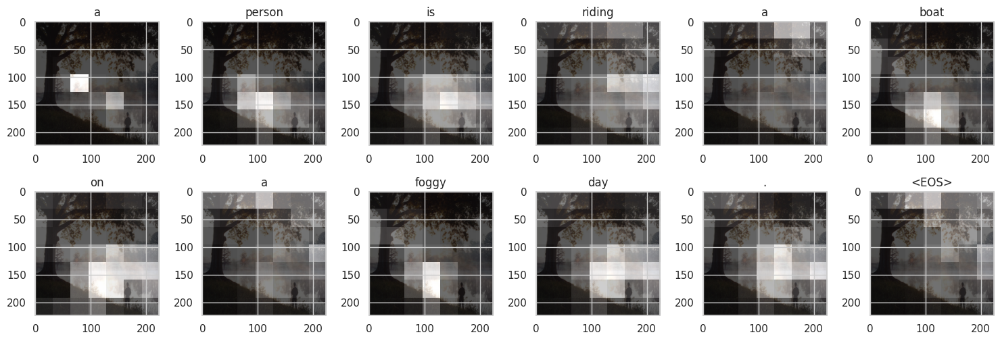

In [77]:
test_img1 = transform(Image.open("/kaggle/input/flickr8k/Images/17273391_55cfc7d3d4.jpg").convert("RGB"))
img1 = copy.deepcopy(test_img1)
capsatt, alphas = get_captions_att(test_img1.unsqueeze(0))

plot_attention(img1, capsatt, alphas)

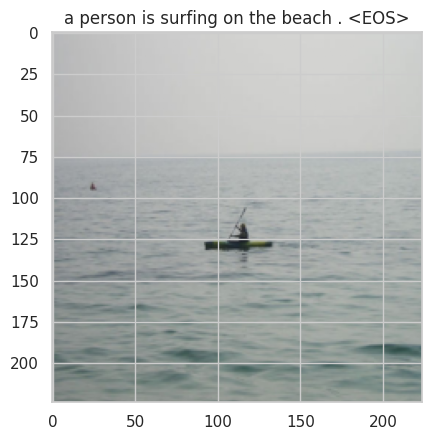

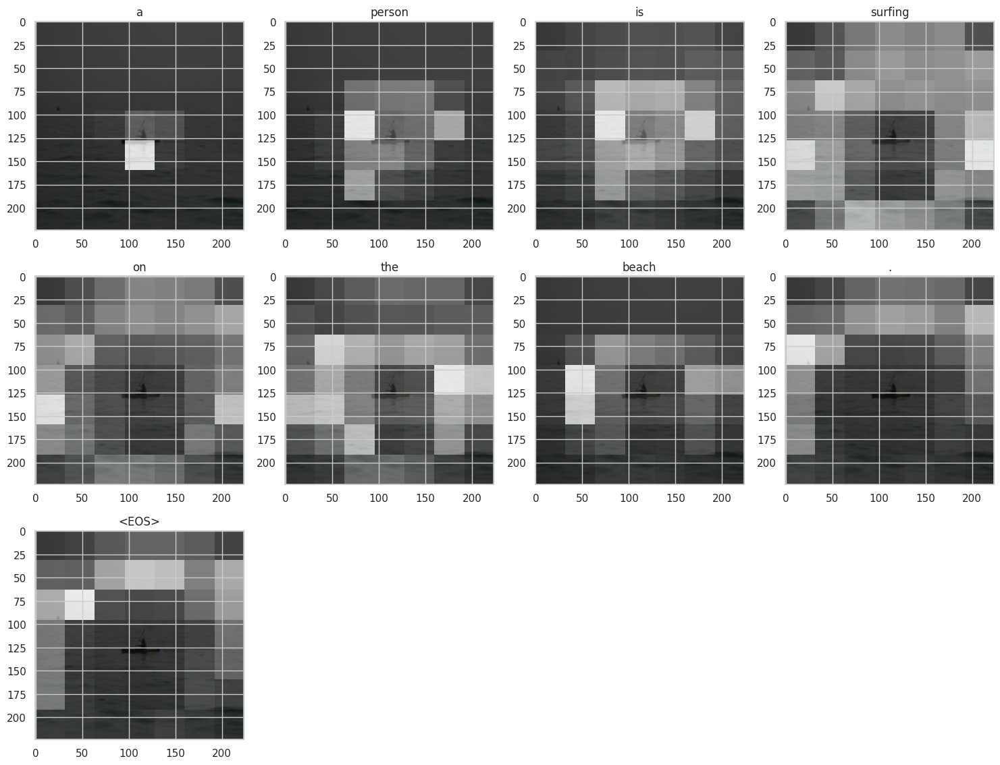

In [78]:
test_img1 = transform(Image.open("/kaggle/input/flickr8k/Images/19212715_20476497a3.jpg").convert("RGB"))
img1 = copy.deepcopy(test_img1)
capsatt, alphas = get_captions_att(test_img1.unsqueeze(0))

plot_attention(img1, capsatt, alphas)

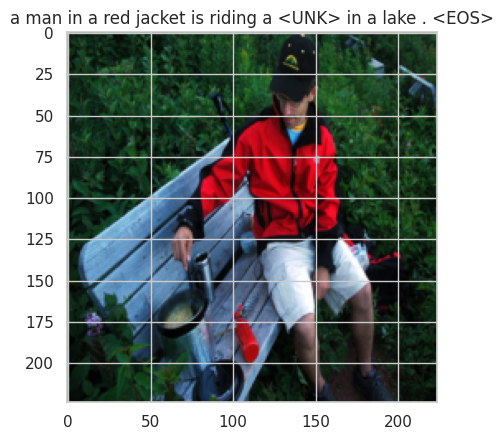

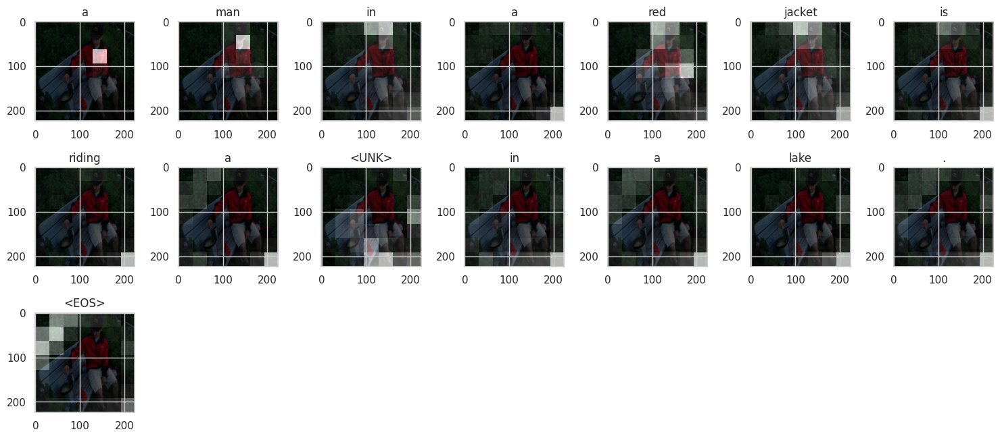

In [79]:
test_img1 = transform(Image.open("/kaggle/input/flickr8k/Images/35506150_cbdb630f4f.jpg").convert("RGB"))
img1 = copy.deepcopy(test_img1)
capsatt, alphas = get_captions_att(test_img1.unsqueeze(0))

plot_attention(img1, capsatt, alphas)

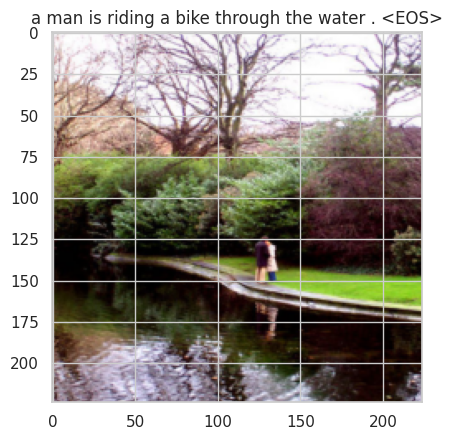

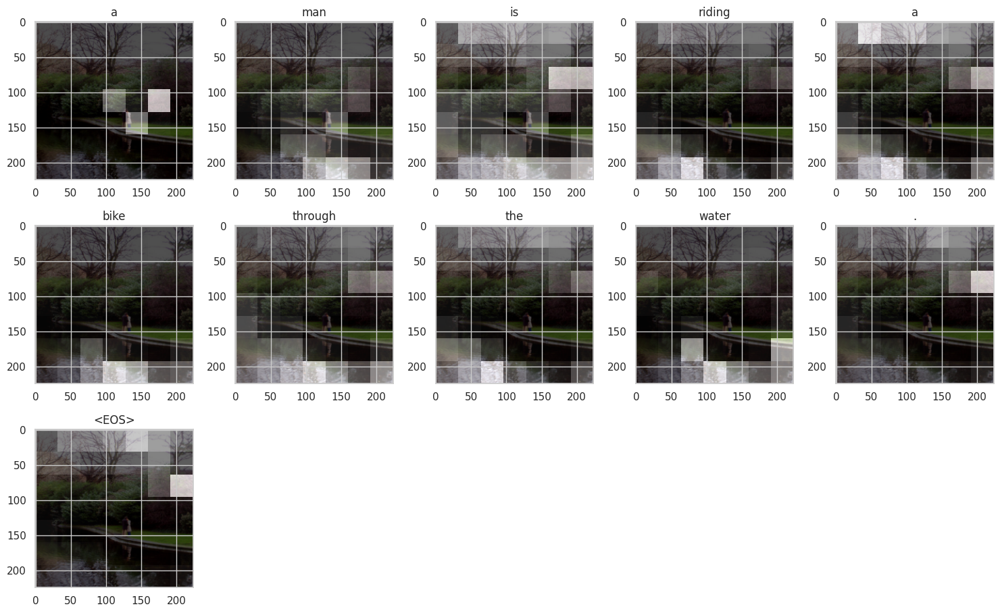

In [80]:
test_img1 = transform(Image.open("/kaggle/input/flickr8k/Images/3637013_c675de7705.jpg").convert("RGB"))
img1 = copy.deepcopy(test_img1)
capsatt, alphas = get_captions_att(test_img1.unsqueeze(0))

plot_attention(img1, capsatt, alphas)

# Tài liệu tham khảo

https://github.com/aamodbk/VR_Image_Captioning/blob/main/imagecaptioning.ipynb